1. process the new audi and lab records <br>
2. Execute Perf_Trans file to get new transferings
3. Process new records in 7.4

### Load and connect

In [37]:
import librosa
import librosa.display

In [2]:
ylab1, srlab1 = librosa.load("G:\\MusicXLab\\20190630\\011005_0193.wav", sr = None)
ylab2, srlab2  = librosa.load("G:\\MusicXLab\\20190630\\011005_0194.wav", sr = None)
yaudi1, sraudi1 = librosa.load("G:\\MusicXLab\\20190704\\011009_0196.wav", sr = None)
yaudi2, sraudi2 = librosa.load("G:\\MusicXLab\\20190704\\011009_0197.wav", sr = None)

In [9]:
import numpy as np

In [10]:
ylab = np.concatenate((ylab1, ylab2))
yaudi = np.concatenate((yaudi1, yaudi2))

In [11]:
sr = srlab1
threshold = 0.003
ref = 0.00002
t = 20

In [15]:
import json
sample_jsonstr = json.dumps({'ylab':list(ylab), 'yaudi':list(yaudi)})
sample_json 
with open ('D:\\Academic_work\\00PerfTransfer\\File\\sample.json','w',encoding='utf-8') as file:
    json.dump(json.dumps(sample_json),file)

MemoryError: 

### Compute DB

In [ ]:
# Computing decibel by time window with length t
# Average intensity of the ﬁrst phase of decay from the peak
def compute_db(frame, t, ref):
    decibel = []
    for i in frame:
        energy = np.array(i ** 2)
        onset = np.where(energy == max(energy))[0][0] # the index of the maximum energy
        tp = np.sqrt(np.mean(energy[onset:(onset + t)])) # # root mean square amplitude of the ﬁrst 10ms after the peak
        decibel.append(librosa.amplitude_to_db([tp], ref)[0])
        
    return decibel

### Compute Delay

In [13]:
def compute_delay(frame, threshold, sr):
    delay = []
    length = sr//100
    for i in range(5632):
        j = 10
        tp = threshold+1
        while(tp > threshold):
            j+=1
            tp = np.sqrt(np.var((frame[i][j*length:j*length+length])))
        delay.append(float(j)/100)
        
    return delay

### To dataframe 

In [18]:
import pandas as pd 
import matplotlib.pyplot as plt
import IPython

In [60]:
673500/sr

14.03125

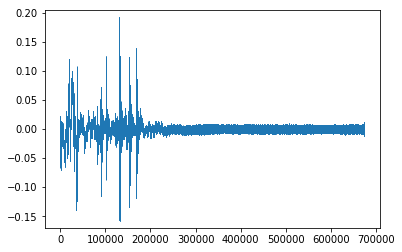

In [39]:
plt.plot(ylab[:673500],'|')

In [27]:
IPython.display.Audio(data=ylab[:600000], rate=sr)

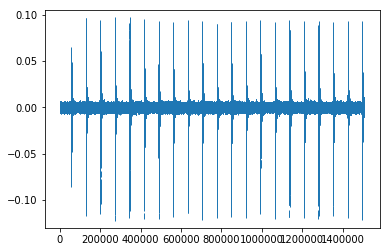

In [25]:
plt.plot(ylab[-int(sr*31.4):], '|')

In [49]:
IPython.display.Audio(data=ylab[-sr*31:], rate=sr)

In [16]:
ylab = ylab[int(sr*14.03125):-int(sr*31.4)]

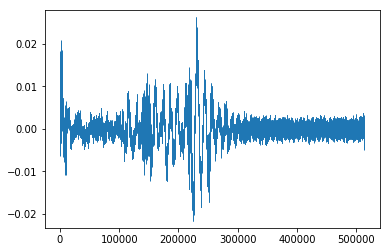

In [22]:
plt.plot(yaudi[:int(sr*10.695)],'|')

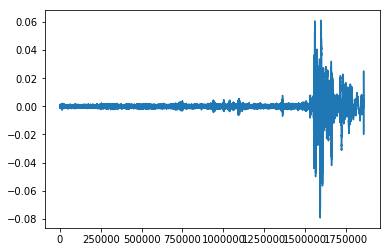

In [34]:
plt.plot(yaudi[-int(sr*38.8):])

In [31]:
IPython.display.Audio(data=yaudi[-(sr*39):], rate=sr)

In [35]:
yaudi = yaudi[int(sr*10.695):-(sr*39)]

In [ ]:
plt.figure(figsize=(8, 5280))
for i in range(880):
    plt.subplot(880,1,i+1)
    if i == 0:
        plt.plot(y[240000:768000],'|')
    else:
        plt.plot(y[768000+480000*(i-1):768000+480000*i])